In [1]:
from numpy import *
from matplotlib.pyplot import *
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401 unused import
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter
from matplotlib import animation, rc
from IPython.display import HTML

%matplotlib notebook

In [2]:
dt, dx = 0.001, 0.01
t_min, t_max = 0, 5
trange = arange(t_min, t_max + dt, dt)
length_of_string = 0.655
nt = len(trange)
c = 1
r = (c * dt)/dx

In [5]:
def find_length(string_length, n):
    """Takes in fret number, RETURNS length of string when fret is pressed"""
    d = 0.035  # distance between fret lines in meters
    if n == 0:
        return string_length
    if n > 0:
        return string_length - (2*n - 1) * (d/2)
    

def initial_motion(n):
    """Takes in fret number and RETURNS the arrays of motion"""

    # Find the length of the string with fret
    length = find_length(length_of_string, n)

    # Initialize arrays
    x_min, x_max = 0, length
    xrange = arange(x_min, x_max+dx, dx)
    nx, nt = len(xrange), len(trange)

    u = zeros((nx, nt))  # where nx is the number of rows and nt is the number of columns

    # Initialize constants
    dy = 0.005  # Displacement of string in meters

    # Initial Position of the Motion
    pluck_position = round(length_of_string/4, 2)  # assume that the position at which we pluck the string is 1/4 L
    array_pluck_position = where(xrange == pluck_position)[0][0]  # one-fourth the length of the WHOLE string

    """Note that this array_pluck_position depends on the whole length of the string and is not subject to change"""

    # For the first portion of the guitar
    for i in range(1, array_pluck_position+1):
        u[i, 0] = ((4*dy)/length_of_string) * xrange[i]
        u[i, 1] = u[i, 0]

    # For the second portion of the guitar
    for j in range(array_pluck_position+1, nx-1):
        u[j, 0] = u[array_pluck_position, 0] - (u[array_pluck_position, 0] / (length - (length_of_string/4))) * (xrange[j] - xrange[array_pluck_position])
        u[j, 1] = u[j, 0]


    return xrange, trange, length, u


def string_motion(n, epsilon, b):
    """Takes in fret number, epsilon and b value, Returns the motion of the wave"""
    xrange, trange, length, u = initial_motion(n)
    nx, nt = len(xrange), len(trange)

    c = 1  # assume that the wave speed is 1
    r = (c * dt)/dx
    M = length/dx

    for t in range(1, nt-1):
        for x in range(1, nx-2):
            u[x, t+1] = (r**2 * (1 + 4*epsilon*M**2) * (u[x+1, t] + u[x-1, t]) + u[x, t] * (2 + 2*b*dt - 2*r**2 - 6*epsilon*(M**2)*(r**2)) -
                         epsilon*r**2*M**2 * (u[x+2, t] + u[x-2, t]) - u[x, t-1]) / (1+2*b*dt)

    return xrange, u


def determine_frequency(n, epsilon, b):
    """Returns the frequencies and magnitudes of the wave"""
    xrange, u = string_motion(n, epsilon, b)
    ft = fft.rfft(u[52, :])  # Python's fast Fourier Transform
    freqs = fft.rfftfreq(len(u[52, :]), trange[1] - trange[0])
    mags = abs(ft)

    return freqs, mags


def energy_calc(u, nx):
    """Returns the total energy of the wave"""
    nx = len(xrange)
    ke = 0
    pe = 0
    for x in range(nx-1):
        pe += 1/2 * (u[x+1] - u[x])**2
        ke += 1/2 * (u[x+1]-u[x])/r**2
        
    return ke + pe

# General Wave Motion Under Ideal Conditions

<IPython.core.display.Javascript object>


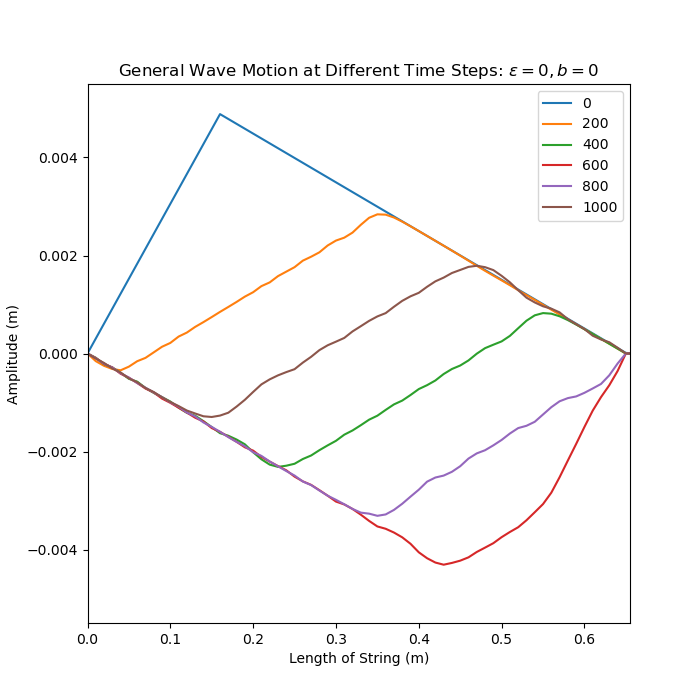

(<matplotlib.legend.Legend at 0x27967150eb0>, None)

In [6]:
y = string_motion(0, 0, 0) # Epsilon = 0 and b = 0
figure(figsize=(7, 7))
axis([0, 0.655, -0.0055, 0.0055])
for blah in range(0, 1200, 200):  # plotting the first 1000 timesteps by increments of 200
    plot(y[0], y[1][:, blah], label=rf'{blah}')

xlabel('Length of String (m)'), ylabel('Amplitude (m)'), title(rf'General Wave Motion at Different Time Steps: $\epsilon = 0, b=0$')    
legend(), show()


# Effect of b-value
Even before we start inspecting the stiffness parameter, we are able to see how the b-value affects the general motion of the wave

<IPython.core.display.Javascript object>


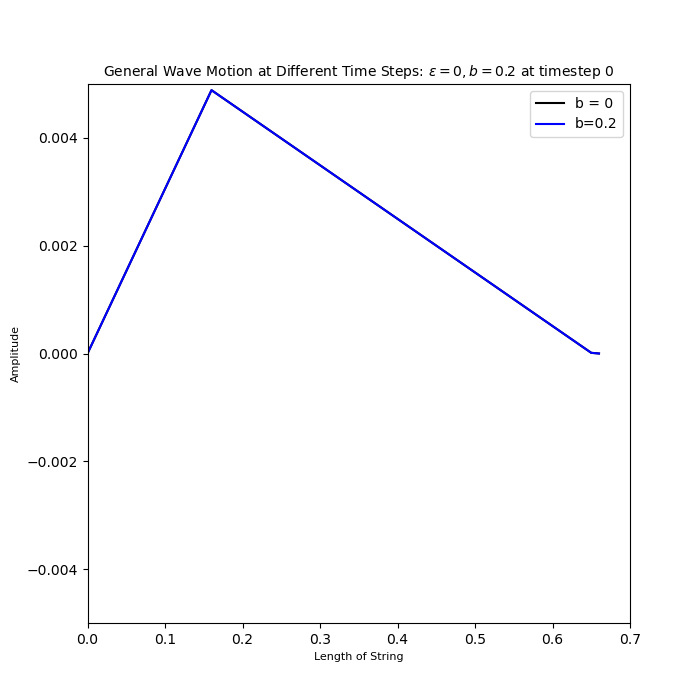

<IPython.core.display.Javascript object>


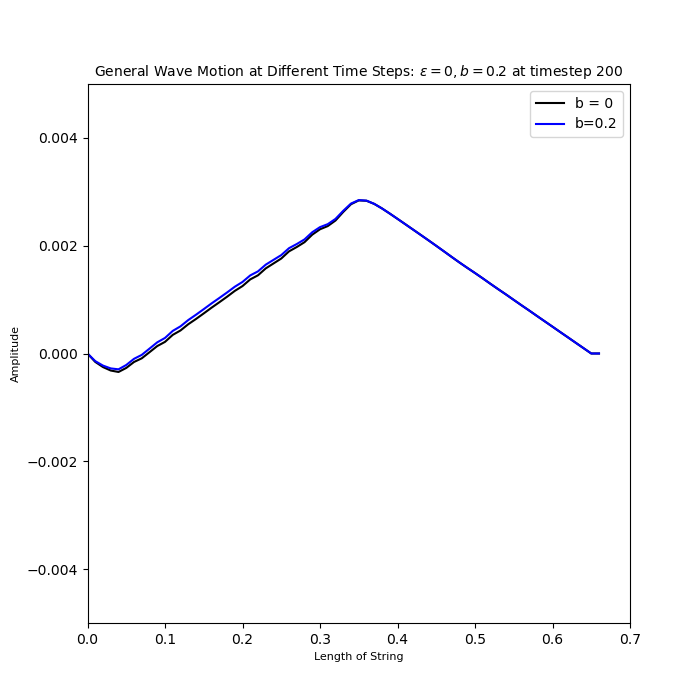

<IPython.core.display.Javascript object>


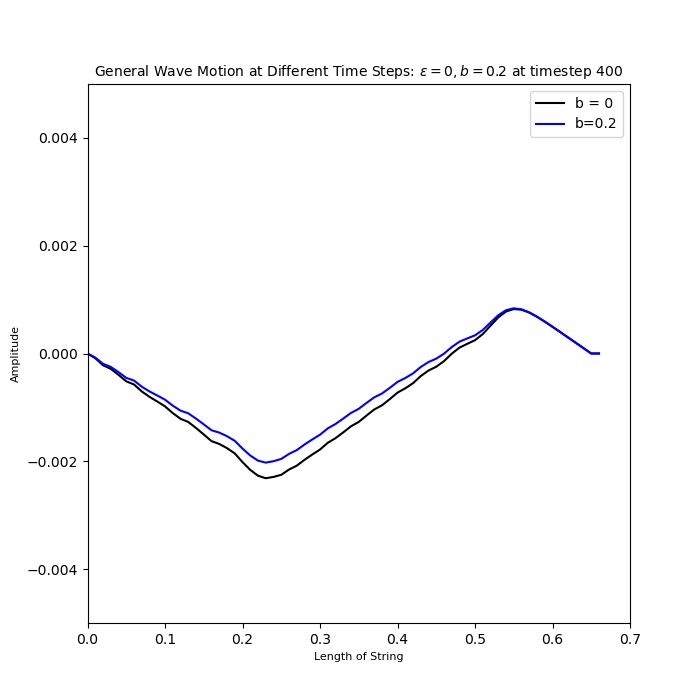

<IPython.core.display.Javascript object>


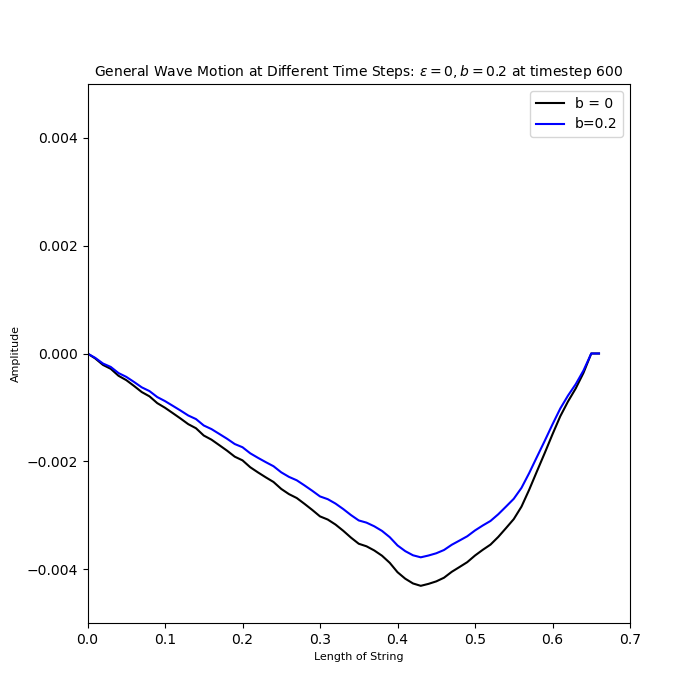

<IPython.core.display.Javascript object>


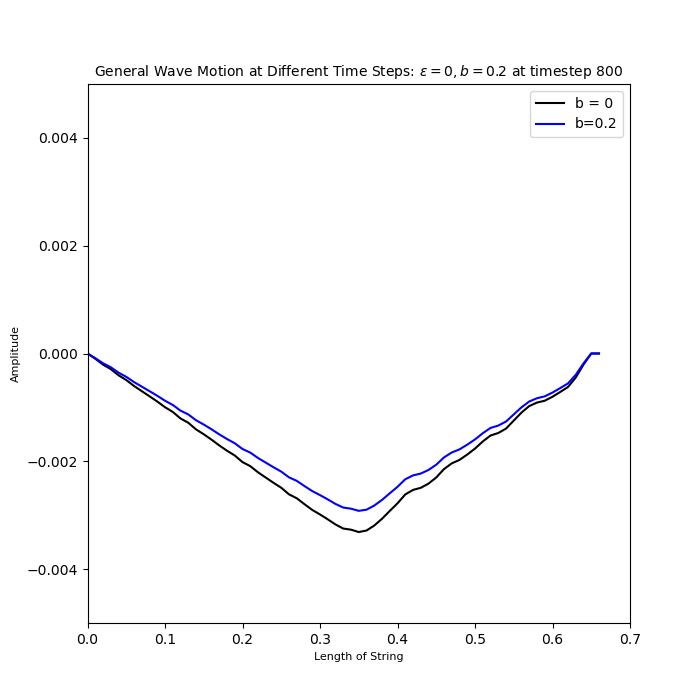

<IPython.core.display.Javascript object>


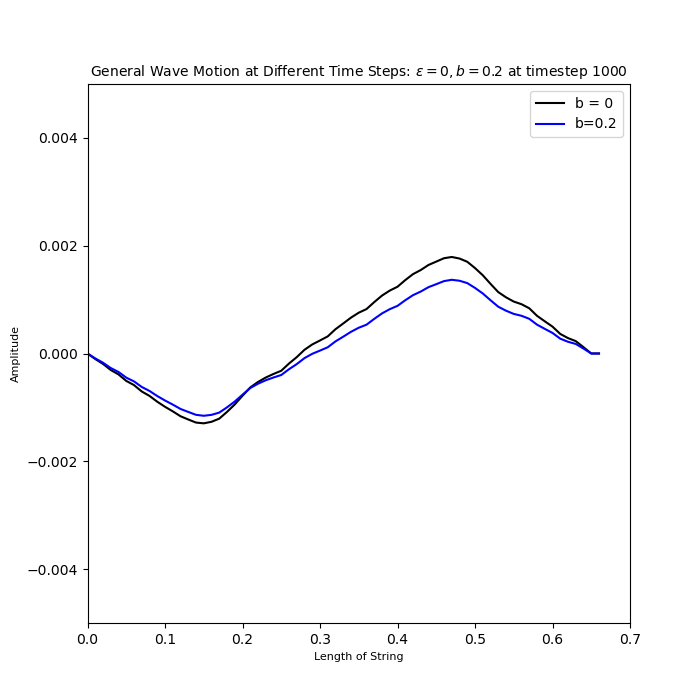

In [7]:
y = string_motion(0, 0, 0)  # b = 0
y1 = string_motion(0, 0, 0.2)  # b = 0.2


for blah in range(0, 1200, 200):  # creating a graph for the first 1000 timesteps by increments of 200
    figure(figsize=(7, 7))
    axis([0, 0.7, -0.005, 0.005])
    plot(y[0], y[1][:, blah], 'k', label='b = 0')
    plot(y1[0], y1[1][:, blah], 'b', label='b=0.2')
    xlabel('Length of String', fontsize=8), ylabel('Amplitude', fontsize=8)
    title(rf'General Wave Motion at Different Time Steps: $\epsilon = 0, b = 0.2$ at timestep {blah}', fontsize=10)
    legend(), show()



# Animating the general motion of the string

<IPython.core.display.Javascript object>


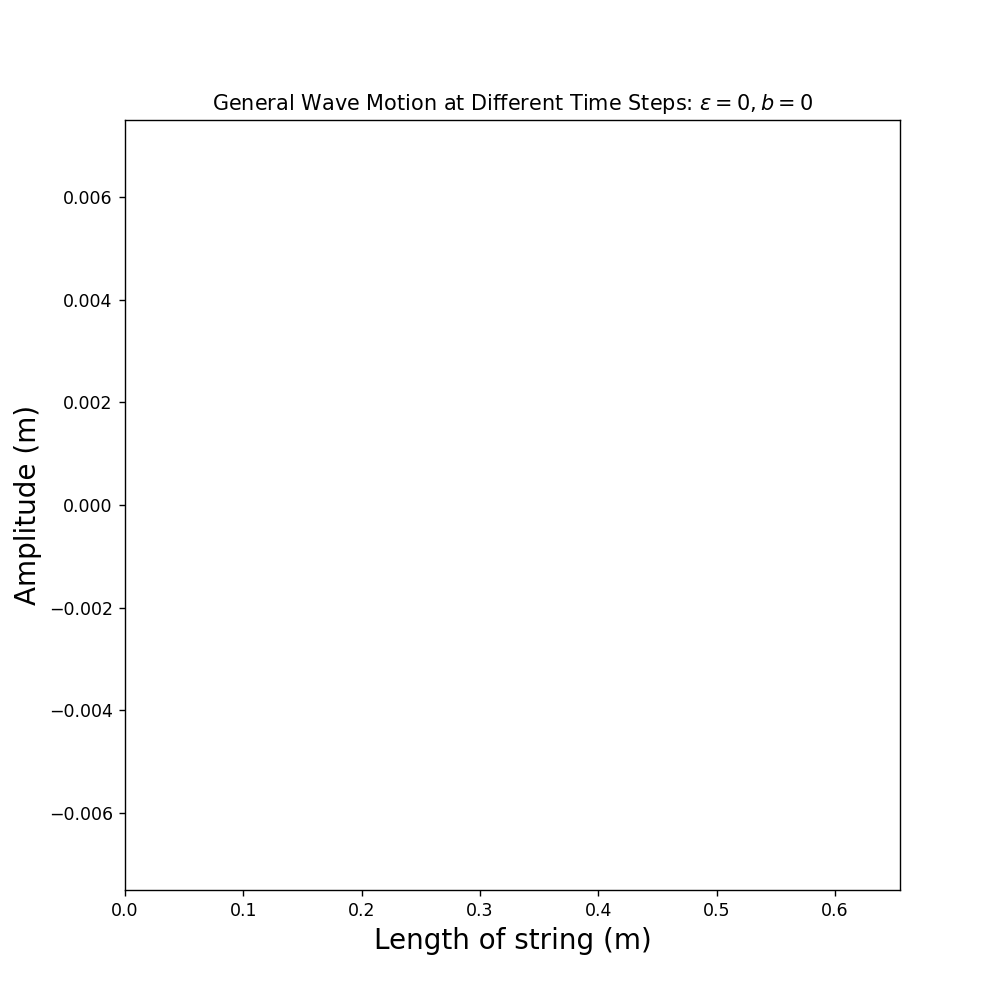

In [16]:
# Animation
z = string_motion(0, 0, 0)  # with epsilon = 0, b = 0

fig, ax = subplots(figsize=(8, 8))
ax.set_xlim((0, 0.655))
ax.set_ylim((-0.0075, 0.0075))
ax.set_xlabel('Length of string (m)', fontsize=16)
ax.set_ylabel('Amplitude (m)', fontsize=16)

line, = ax.plot([], [], lw=2)

def init():
    line.set_data([], [])
    return (line,)

def animate(i):
    x = z[0]
    y = z[1][:, i]
    line.set_data(x, y)
    ax.set_title(rf'General Wave Motion at Different Time Steps: $\epsilon= 0, b=0$')
    
    return (line,)
    

anim = animation.FuncAnimation(fig, animate, init_func=init, frames=nt, interval=1, blit=True)

HTML(anim.to_html5_video())

# Example Fourier Transform
This is roughly what our Fourier transform plot should like for a given epsilon value. 

<IPython.core.display.Javascript object>


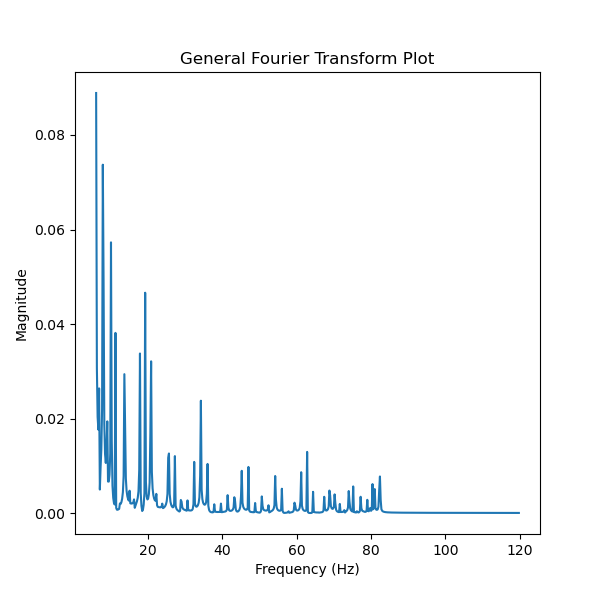

([<matplotlib.lines.Line2D at 0x21c38f12580>], None)

In [6]:
test_epsilon = 0.000325
freq, mag = determine_frequency(0, test_epsilon, 0)
fund_freq = freq[where(mag == max(mag[400:500]))]
figure(figsize=(6, 6))
ylabel('Magnitude'), xlabel('Frequency (Hz)'), title('General Fourier Transform Plot')
plot(freq[30:600], mag[30:600]), show()  # Zooming in on the graph to see the actual trend

# Tuning the instrument

#### Testing the Epsilon Range for the 6th String (E) 
After trial and error, I found that the epsilon value is approximately $\epsilon \approx 0.000320$. For the tuning, we will allow the frictional force component $b=0$ so that we can simulate ideal conditions.  

For the 6th string, epsilon = 0.000325
This produces a frequency of 82.38 Hz


<IPython.core.display.Javascript object>


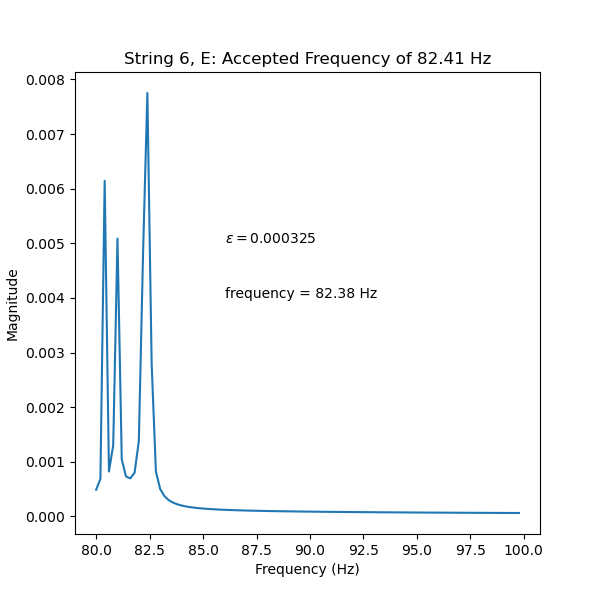

([<matplotlib.lines.Line2D at 0x2b5ed921220>], None)

In [60]:
epsilon_range = arange(0.000320, 0.000350, 0.000001)  # expected range of epsilons
for epsilon in epsilon_range:
    freq, mag = determine_frequency(0, epsilon, 0)
    fund_freq = freq[where(mag == max(mag[400:500]))]
    
    df = 0.1
    if 82.41 - df <= fund_freq <= 82.41 + df:
        print(rf'For the 6th string, epsilon = {epsilon:.6f}')
        print(rf'This produces a frequency of {fund_freq[0]:.2f} Hz')
        fun_freq = fund_freq
        correct_epsilon = epsilon
        break  # stops the for loop as soon as we find the correct epsilon

figure(figsize=(6, 6))
text(86, 0.005, rf'$\epsilon = {correct_epsilon:.6f}$')
text(86, 0.004, rf'frequency = {fun_freq[0]:.2f} Hz')
xlabel('Frequency (Hz)'), ylabel('Magnitude'), title('String 6, E: Accepted Frequency of 82.41 Hz')
plot(freq[400:500], mag[400:500]), show() 

#### Testing the Epsilon Range for the 5th String (A) 
After trial and error, I found that the epsilon value is approximately $\epsilon \approx 0.000610$. 

For the 5th string, epsilon = 0.000612
This produces a frequency of 109.98 Hz


<IPython.core.display.Javascript object>


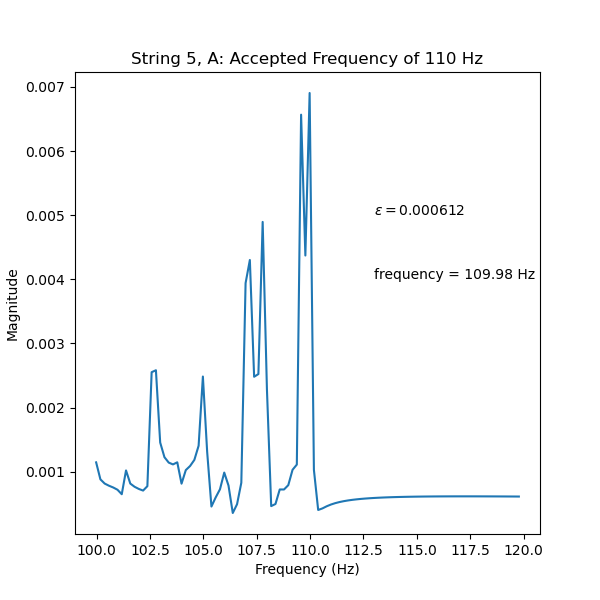

([<matplotlib.lines.Line2D at 0x2b5ee63cdf0>], None)

In [61]:
epsilon_range = arange(0.000610, 0.000630, 0.000001)
for epsilon in epsilon_range:
    freq, mag = determine_frequency(0, epsilon, 0)
    fund_freq = freq[where(mag == max(mag[500:600]))]
    
    df = 0.1
    if 110.00 - df <= fund_freq <= 110.00 + df:
        print(rf'For the 5th string, epsilon = {epsilon:.6f}')
        print(rf'This produces a frequency of {fund_freq[0]:.2f} Hz')
        fun_freq = fund_freq
        correct_epsilon = epsilon

        break

figure(figsize=(6, 6))
text(113, 0.005, rf'$\epsilon = {correct_epsilon:.6f}$')
text(113, 0.004, rf'frequency = {fun_freq[0]:.2f} Hz')
xlabel('Frequency (Hz)'), ylabel('Magnitude'), title('String 5, A: Accepted Frequency of 110 Hz')
plot(freq[500:600], mag[500:600]), show() 

#### Testing the Epsilon Range for the 4th String (D)
After trial and error, I found that the epsilon value is approximately $\epsilon \approx 0.001100$

For the 4th string, epsilon = 0.001100
This produces a frequency of 146.77 Hz


<IPython.core.display.Javascript object>


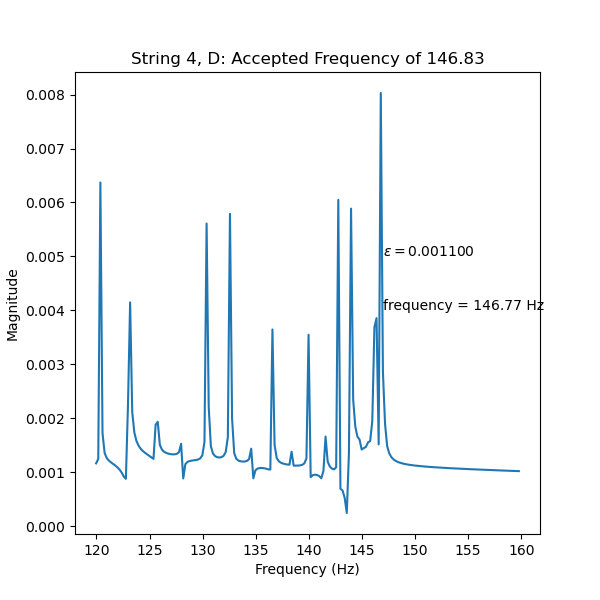

([<matplotlib.lines.Line2D at 0x2b5ed90ab50>], None)

In [31]:
epsilon_range = arange(0.001090, 0.001200, 0.000001)
for epsilon in epsilon_range:
    freq, mag = determine_frequency(0, epsilon, 0)
    fund_freq = freq[where(mag == max(mag[600:800]))]
    
    df = 0.1
    if 146.83 - df <= fund_freq <= 146.83 + df:
        print(rf'For the 4th string, epsilon = {epsilon:.6f}')
        print(rf'This produces a frequency of {fund_freq[0]:.2f} Hz')
        fun_freq = fund_freq
        correct_epsilon = epsilon

        break

figure(figsize=(6, 6))
text(147, 0.005, rf'$\epsilon = {correct_epsilon:.6f}$')
text(147, 0.004, rf'frequency = {fun_freq[0]:.2f} Hz')
xlabel('Frequency (Hz)'), ylabel('Magnitude'), title('String 4, D: Accepted Frequency of 146.83')
plot(freq[600:800], mag[600:800]), show() 

#### Testing the Epsilon Range for the 3rd String (G)
After trial and error, I found that the epsilon value is approximately $\epsilon \approx 0.001950$.

For the 3rd string, epsilon = 0.001893
This produces a frequency of 195.96 Hz


<IPython.core.display.Javascript object>


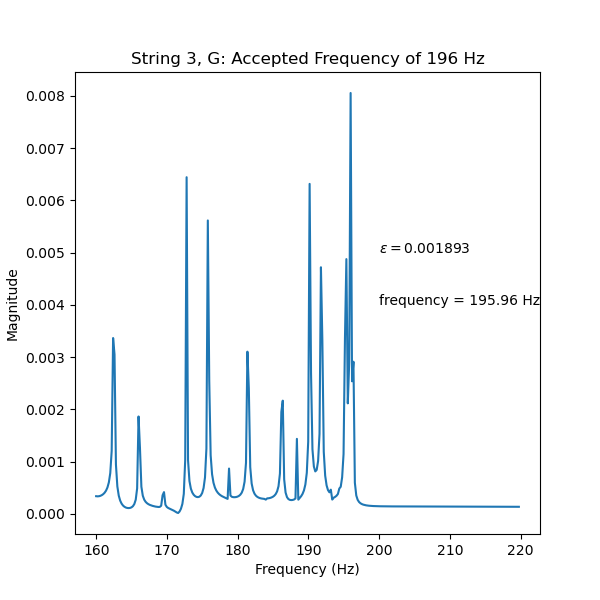

([<matplotlib.lines.Line2D at 0x2b5edc59670>], None)

In [32]:
epsilon_range = arange(0.001870, 0.001950, 0.000001)
for epsilon in epsilon_range:
    freq, mag = determine_frequency(0, epsilon, 0)
    fund_freq = freq[where(mag == max(mag[800:1100]))]
    
    df = 0.1
    if 196 - df <= fund_freq <= 196 + df:
        print(rf'For the 3rd string, epsilon = {epsilon:.6f}')
        print(rf'This produces a frequency of {fund_freq[0]:.2f} Hz')
        fun_freq = fund_freq
        correct_epsilon = epsilon

        break

figure(figsize=(6, 6))
text(200, 0.005, rf'$\epsilon = {correct_epsilon:.6f}$')
text(200, 0.004, rf'frequency = {fun_freq[0]:.2f} Hz')
xlabel('Frequency (Hz)'), ylabel('Magnitude'), title('String 3, G: Accepted Frequency of 196 Hz')
plot(freq[800:1100], mag[800:1100]), show() 

#### Testing the Epsilon Range for the 2nd String (B)
After trial and error, I found that the epsilon value is approximately $\epsilon \approx 0.002812$.

For the 2nd string, epsilon = 0.002812
This produces a frequency of 246.95 Hz


<IPython.core.display.Javascript object>


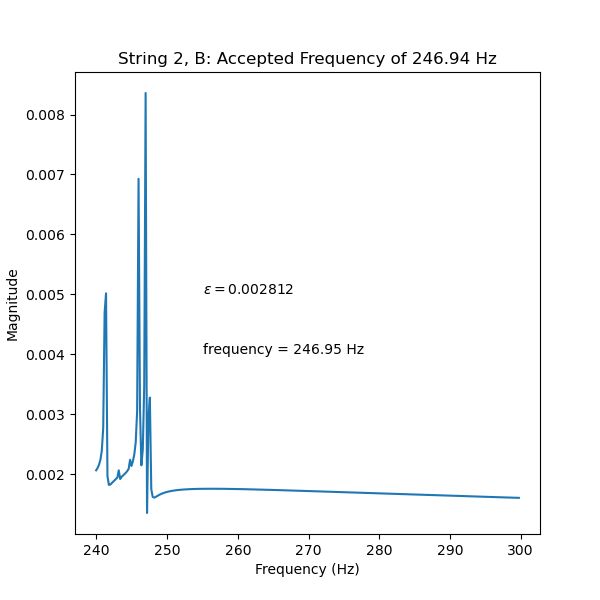

([<matplotlib.lines.Line2D at 0x2b5edf8aee0>], None)

In [33]:
epsilon_range = arange(0.002800, 0.002900, 0.000001)
for epsilon in epsilon_range:
    freq, mag = determine_frequency(0, epsilon, 0)
    fund_freq = freq[where(mag == max(mag[1200:1500]))]
    
    df = 0.1
    if 246.94 - df <= fund_freq <= 246.94 + df:
        print(rf'For the 2nd string, epsilon = {epsilon:.6f}')
        print(rf'This produces a frequency of {fund_freq[0]:.2f} Hz')
        fun_freq = fund_freq
        correct_epsilon = epsilon
        break
        
figure(figsize=(6, 6))
text(255, 0.005, rf'$\epsilon = {correct_epsilon:.6f}$')
text(255, 0.004, rf'frequency = {fun_freq[0]:.2f} Hz')
xlabel('Frequency (Hz)'), ylabel('Magnitude'), title('String 2, B: Accepted Frequency of 246.94 Hz')
plot(freq[1200:1500], mag[1200:1500]), show() 

#### Testing the Epsilon Range for the 1st String (E)
After trial and error, I found that the epsilon value is approximately $\epsilon \approx 0.004250$.

For the 1st string, epsilon = 0.004271
This produces a frequency of 329.53 Hz


<IPython.core.display.Javascript object>


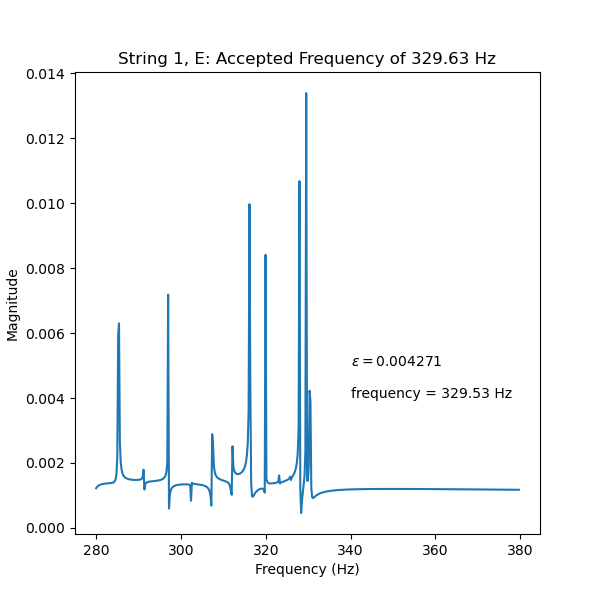

([<matplotlib.lines.Line2D at 0x2b5ee61beb0>], None)

In [35]:
epsilon_range = arange(0.004260, 0.004300, 0.000001)
for epsilon in epsilon_range:
    freq, mag = determine_frequency(0, epsilon, 0)
    fund_freq = freq[where(mag == max(mag[1400:1900]))]
    
    df = 0.1
    if 329.63 - df <= fund_freq <= 329.63 + df:
        print(rf'For the 1st string, epsilon = {epsilon:.6f}')
        print(rf'This produces a frequency of {fund_freq[0]:.2f} Hz')
        fun_freq = fund_freq
        correct_epsilon = epsilon
        break
        
figure(figsize=(6, 6))
text(340, 0.005, rf'$\epsilon = {correct_epsilon:.6f}$')
text(340, 0.004, rf'frequency = {fun_freq[0]:.2f} Hz')
xlabel('Frequency (Hz)'), ylabel('Magnitude'), title('String 1, E: Accepted Frequency of 329.63 Hz')
plot(freq[1400:1900], mag[1400:1900]), show() 

In [36]:
#                    6E         5A        4D        3G       2B         1E          
epsilon_values = [0.000325, 0.000612, 0.001100, 0.001893, 0.002812, 0.004271]

# Testing the effect of the b coefficient
Up until now, we've been tuning our instrument in ideal conditions but we now want to see how the friction coefficient affects the frequencies. To test this, we will take every epsilon value (that is, every string) and compare the differences in frequencies to find a relationship.

For epsilon = 0.000325
The frequency when b = 0 is f = 82.38 Hz


<IPython.core.display.Javascript object>


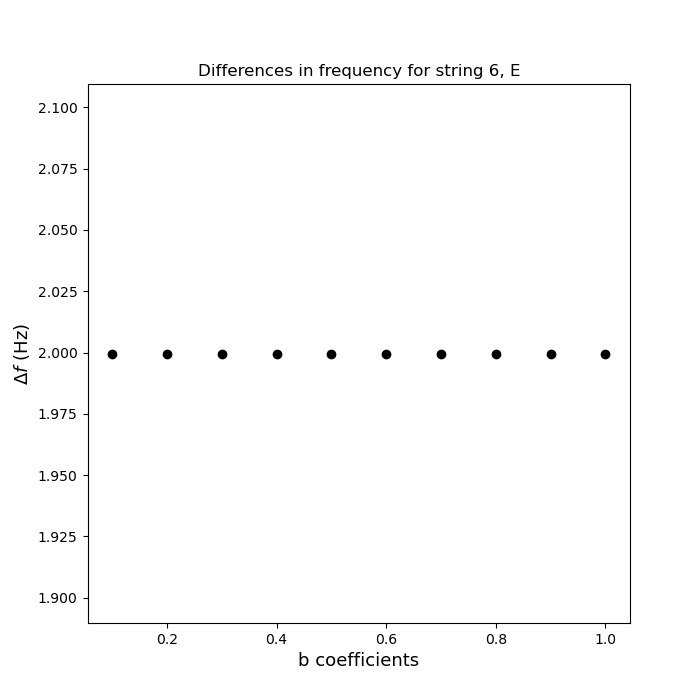

For epsilon = 0.000612
The frequency when b = 0 is f = 109.98 Hz


<IPython.core.display.Javascript object>


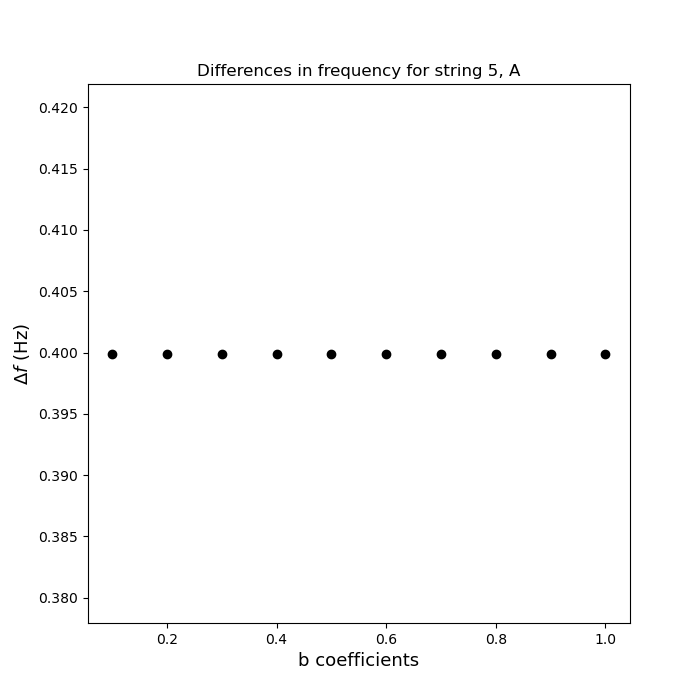

For epsilon = 0.0011
The frequency when b = 0 is f = 146.77 Hz


<IPython.core.display.Javascript object>


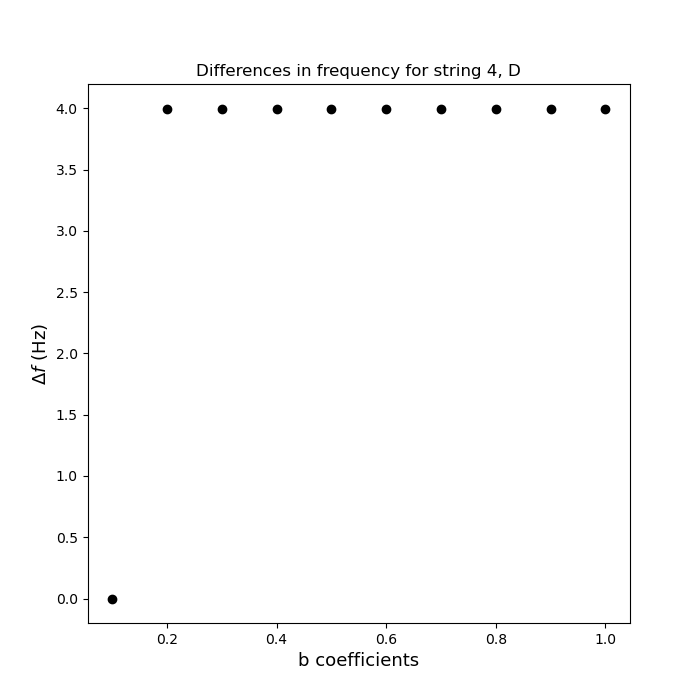

For epsilon = 0.001893
The frequency when b = 0 is f = 195.96 Hz


<IPython.core.display.Javascript object>


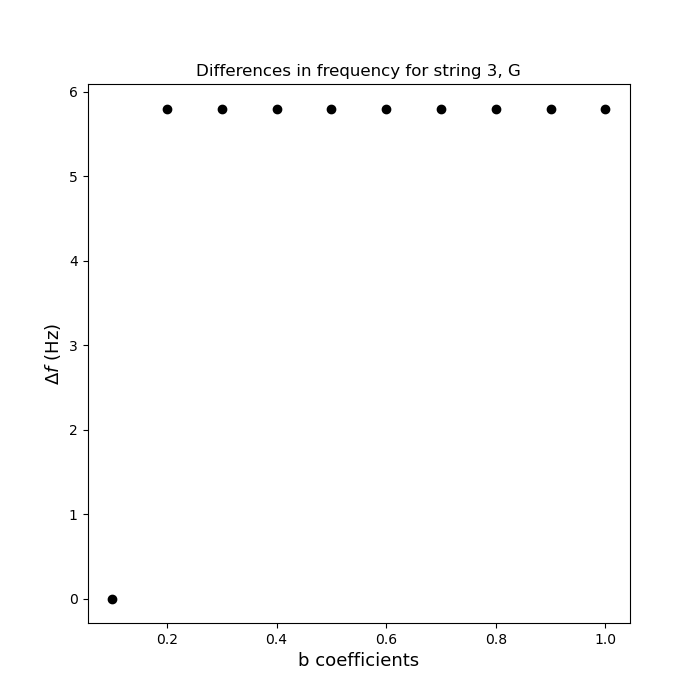

For epsilon = 0.002812
The frequency when b = 0 is f = 246.95 Hz


<IPython.core.display.Javascript object>


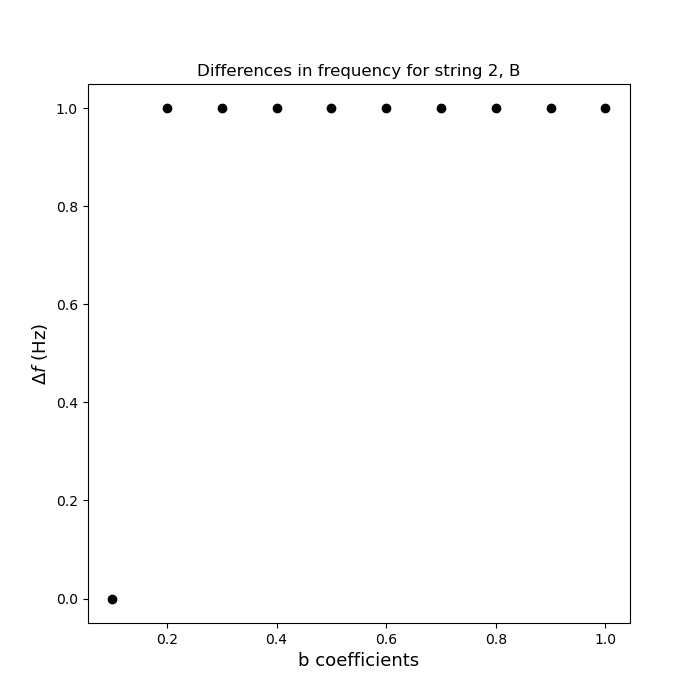

For epsilon = 0.004271
The frequency when b = 0 is f = 329.53 Hz


<IPython.core.display.Javascript object>


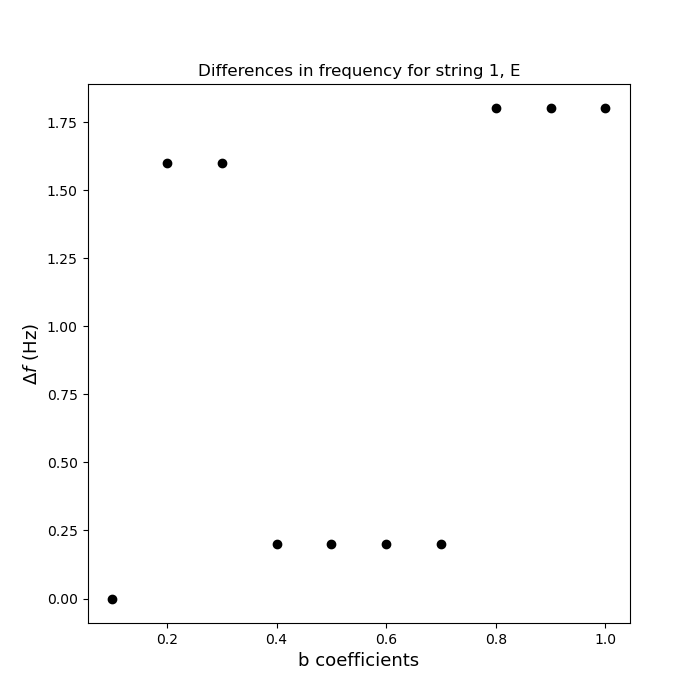

In [41]:
strings = ['6, E', '5, A', '4, D', '3, G', '2, B', '1, E']
b_values = arange(.1, 1.1, 0.1)  # different testing values

#                    6E         5A        4D        3G       2B         1E          
epsilon_values = [0.000325, 0.000612, 0.001100, 0.001893, 0.002812, 0.004271]
lower_bounds = [400, 500, 700, 800, 1200, 1600]  # Bounds so that our graphs are more easily readable
upper_bounds = [500, 600, 800, 1100, 1500, 1900]

i = 0

for epsilon in epsilon_values:
    original_frequency, mags = determine_frequency(0, epsilon, 0)  # open, epsilon, and b=0
    original_fund_freq = original_frequency[where(mags == max(mags[lower_bounds[i]:upper_bounds[i]]))]
    print(fr'For epsilon = {epsilon}')
    print(fr'The frequency when b = 0 is f = {original_fund_freq[0]:.2f} Hz')

    frequency_differences = []  # where we store the frequency differences 
    for b in b_values:
        freq, mag = determine_frequency(0, epsilon, b)
        fund_freq = freq[where(mag == max(mag[lower_bounds[i]:upper_bounds[i]]))]

        delta_frequency = original_fund_freq[0] - fund_freq[0]
        frequency_differences.append(delta_frequency)


    figure(figsize=(7, 7))
    xlabel('b coefficients', fontsize=13), ylabel(rf'$\Delta f$ (Hz)', fontsize=13), title(rf'Differences in frequency for string {strings[i]}')
    plot(b_values, frequency_differences, 'ko'), show()

    i += 1

## Analysis
- It seems that the change in b has almost no effect on the less stiff strings
- We start to see some, although inconsistent, changes in frequency for the less stiff strings. 
- From this, we can very easily argue that the the b coefficient in general has almost no effect on the frequency of the
  strings and that in general has little effect on the motion of the string
- Although the b coefficient has little impact on the fundamental frequency of the string, it does have an impact on the
  overall decay of the frequency. Before we were looking at a more zoomed in version of the graph, but by zooming out we can 
  see that the decay is much more aggressive. 
  

# Frequency Distribution for different b-values

<IPython.core.display.Javascript object>


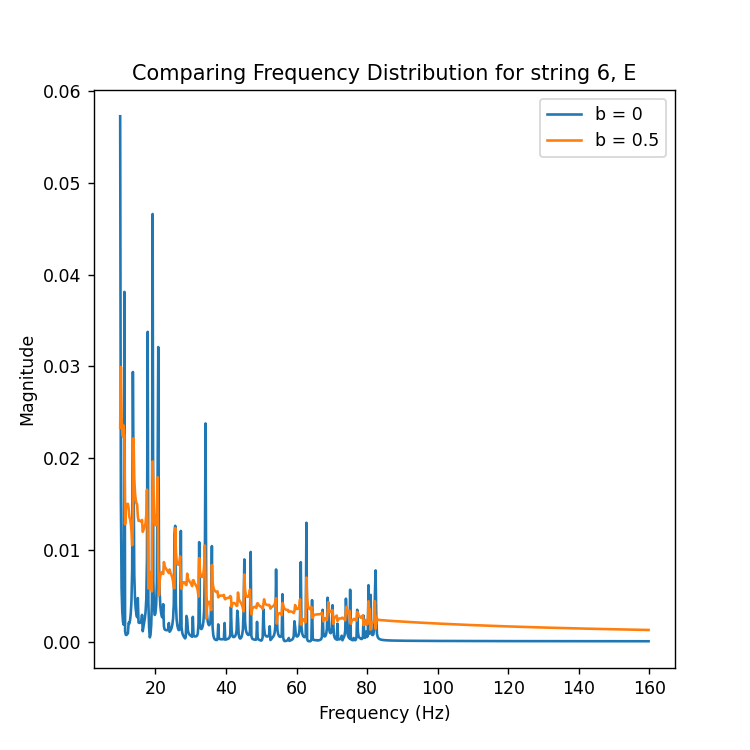

<IPython.core.display.Javascript object>


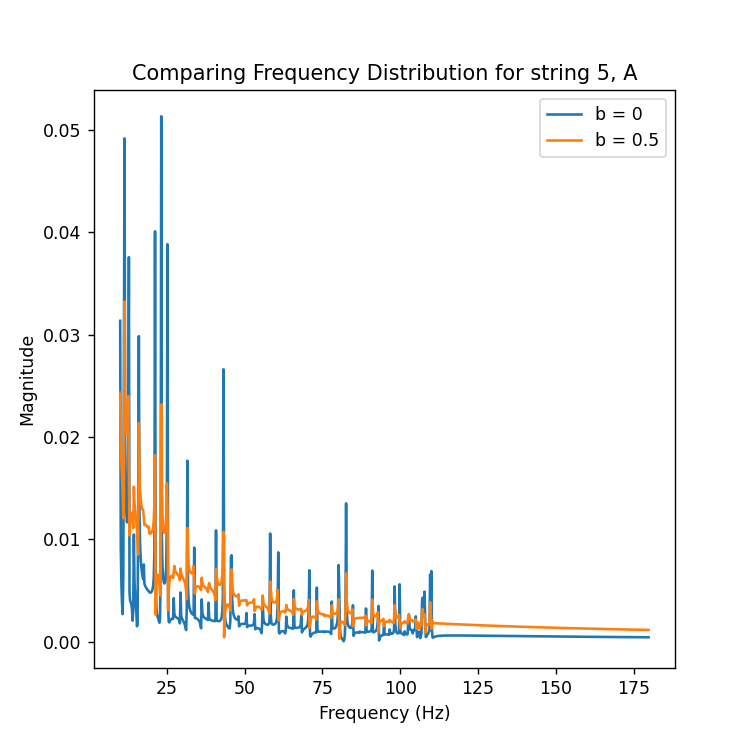

<IPython.core.display.Javascript object>


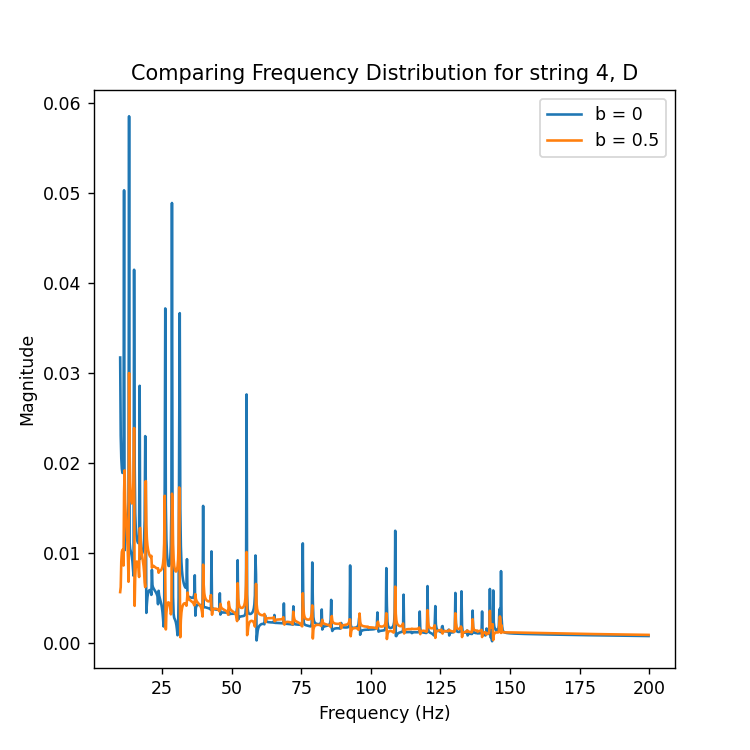

<IPython.core.display.Javascript object>


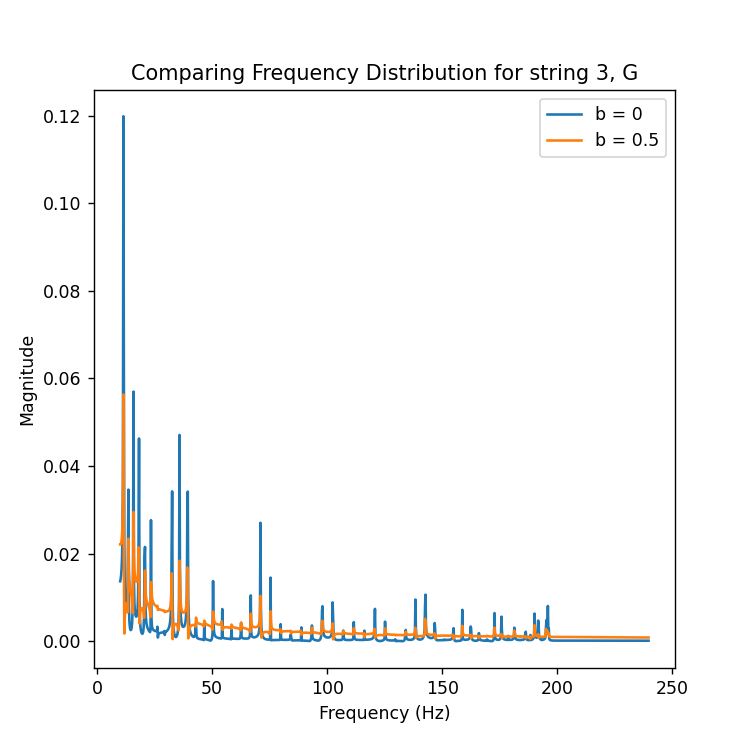

<IPython.core.display.Javascript object>


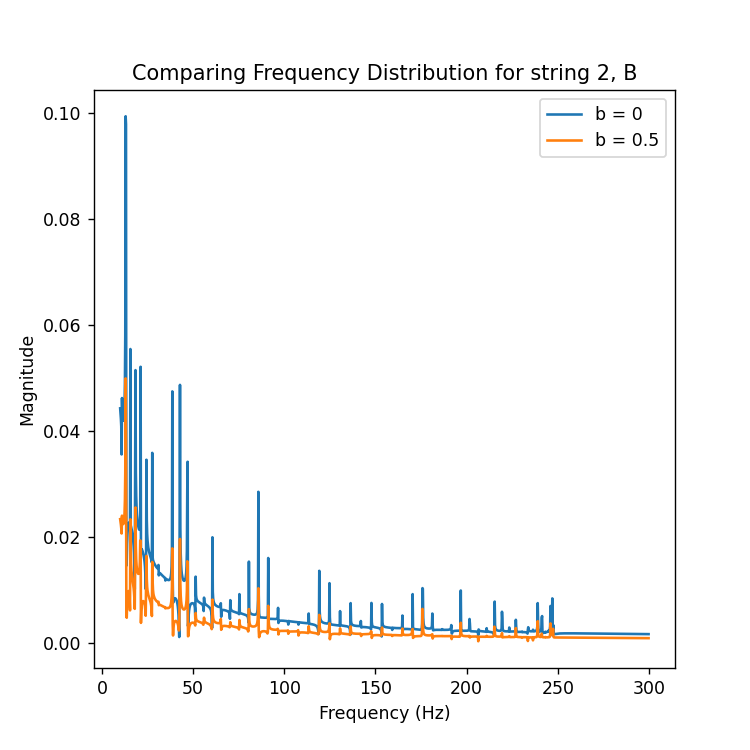

<IPython.core.display.Javascript object>


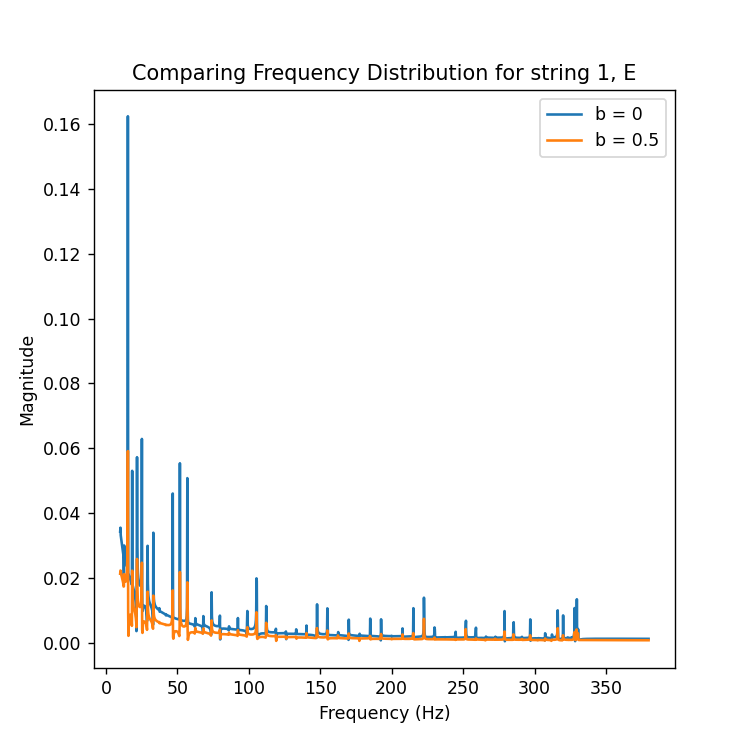

In [39]:
# Choose a constant b and compare the strings when zoomed out
b = 0.5
#                    6E         5A        4D        3G       2B         1E          
epsilon_values = [0.000325, 0.000612, 0.001100, 0.001893, 0.002812, 0.004271]
upper_bounds = [800, 900, 1000, 1200, 1500, 1900]

i = 0
for epsilon in epsilon_values:
    frequency_no_b, mags_no_b = determine_frequency(0, epsilon, 0)
    frequency, mags = determine_frequency(0, epsilon, b)
    
    figure(figsize=(6, 6))
    plot(frequency_no_b[50:upper_bounds[i]], mags_no_b[50:upper_bounds[i]], label=rf'b = 0')

    plot(frequency[50:upper_bounds[i]], mags[50:upper_bounds[i]], label=rf'b = 0.5')
    xlabel('Frequency (Hz)'), ylabel('Magnitude'), title(rf'Comparing Frequency Distribution for string {strings[i]}')
    legend(), show()
    i += 1


## Analysis
- For the sixth (E), fifth (A), and third (G) strings, the magnitudes of the frequencies when $b = 0$ decays more rapidly than 
  the magnitudes of the frequencies when $b = 0.5$. 
- The trends of the magnitudes when $b = 0$ and $b = 0.5$ are almost identical for the fourth (D) string. 
- For the second (B) and first (E) strings, the magnitudes of the frequencies when $b = 0.5$ decays more rapidly than the
  magnitudes of the frequencies when $b = 0$. 

- Regardless of the trend, we see that the location of these harmonics and frequencies are almost identical. However, we do 
  see that the decay is often variable. 

# Conservation of Energy
Since all of the strings experience the same friction coefficient, we will examine the energy vs time graph for all strings on the same graph.

<IPython.core.display.Javascript object>


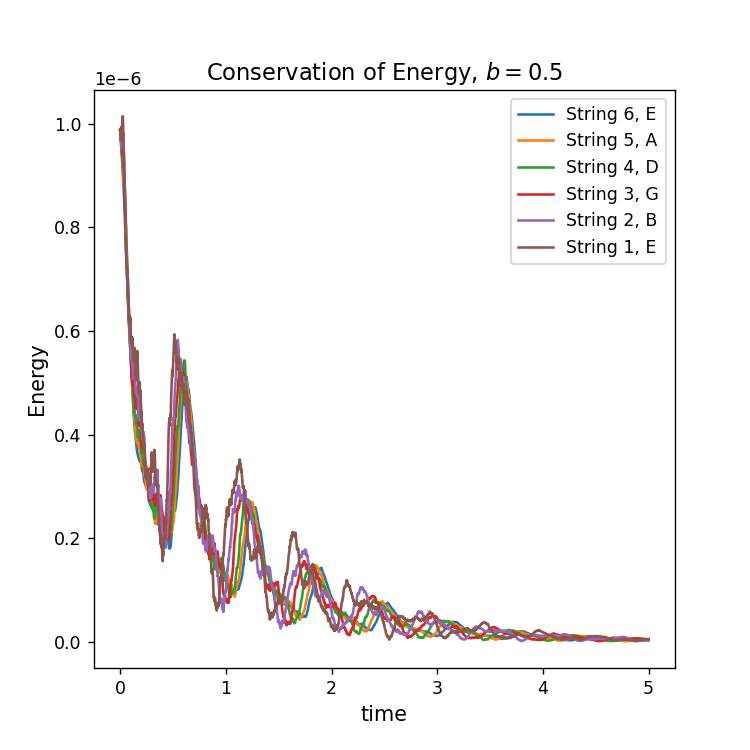

(<matplotlib.legend.Legend at 0x1d6062ffee0>, None)

In [50]:
#                    6E         5A        4D        3G       2B         1E          
epsilon_values = [0.000325, 0.000612, 0.001100, 0.001893, 0.002812, 0.004271]
xrange = initial_motion(0)[0]
nx = len(xrange)

figure(figsize=(6, 6))
counter = 0
for epsilon in epsilon_values:
    y = string_motion(0, epsilon, 0.5)[1]

    for i in range(nt):  # calculate the energy at every timestep
        total_energy[i] = energy_calc(y[:, i], nx)  # calling the energy function
        
    plot(trange, total_energy, label=rf'String {strings[counter]}')
    counter += 1

xlabel('time', fontsize=12), ylabel('Energy', fontsize=12), title('Conservation of Energy, $b = 0.5$', fontsize=13)
legend(), show()
    

The mechanical energy of each string as time passes. Every trough indicates the bottom of its motion and every peak is the top of its motion. For example, at 0.5 seconds the string reaches the bottom of its motion and the energy jumps as it is slingshot to the top of its motion at 0.75 seconds and then starts decaying again.  

# Creating a Chord
We will now be attempting to create a chord using different frets and strings. The chord we will be creating is the G major chord. To create this chord we will need all 6 strings with the following combination
<center> String 1: 3rd fret<center> 
<center> String 2: Open    <center> 
<center> String 3: Open    <center>  
<center> String 4: Open    <center> 
<center> String 5: 2nd fret<center> 
<center> String 6: 3rd fret<center> 

<IPython.core.display.Javascript object>


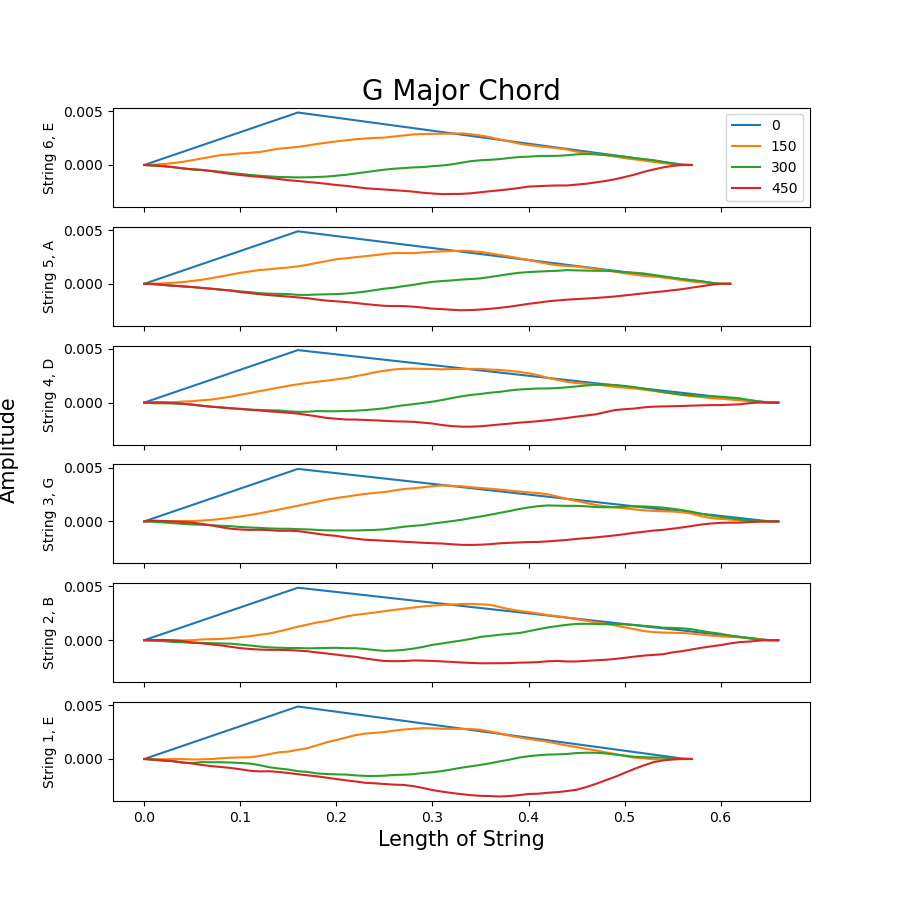

In [47]:
#                     E   ,    A    ,     D   ,     G   ,     B   ,     E
epsilon_values = [0.000325, 0.000612, 0.001100, 0.001893, 0.002812, 0.004271]

string6_E = string_motion(3, epsilon_values[0], 0.5)  # 3rd fret, epsilons from list, b = 0.5 
string5_A = string_motion(2, epsilon_values[1], 0.5)  # 2nd fret, epsilons from list, b = 0.5
string4_D = string_motion(0, epsilon_values[2], 0.5)  # open, epsilons from list, b = 0.5
string3_G = string_motion(0, epsilon_values[3], 0.5)  # open, epsilons from list, b = 0.5
string2_B = string_motion(0, epsilon_values[4], 0.5)  # open, epsilons from list, b = 0.5
string1_E = string_motion(3, epsilon_values[5], 0.5)  # 3rd fret, epsilons from list, b = 0.5




fig, (ax1, ax2, ax3, ax4, ax5, ax6) = subplots(6, sharex=True, sharey=True, figsize=(9, 9))
xlabel("Length of String", fontsize=15)  #xlabel
fig.text(0.01, 0.5, 'Amplitude', ha='center', va='center', rotation='vertical', fontsize=15)  #ylabel
ax1.set_title('G Major Chord', fontsize=20)

ax1.set_ylabel('String 6, E')
ax2.set_ylabel('String 5, A')
ax3.set_ylabel('String 4, D')
ax4.set_ylabel('String 3, G')
ax5.set_ylabel('String 2, B')
ax6.set_ylabel('String 1, E')


for time_instance in range(0, 600, 150): # plotting the motion of each string in its respective subplot
    ax1.plot(string6_E[0], string6_E[1][:, time_instance], label=rf'{time_instance}')  
    ax2.plot(string5_A[0], string5_A[1][:, time_instance])
    ax3.plot(string4_D[0], string4_D[1][:, time_instance])
    ax4.plot(string3_G[0], string3_G[1][:, time_instance])
    ax5.plot(string2_B[0], string2_B[1][:, time_instance])
    ax6.plot(string1_E[0], string1_E[1][:, time_instance])

ax1.legend(loc="center right")  # so we only put the legend once
show()


    

## Animation
This is the motion of the string as time progresses. 

<IPython.core.display.Javascript object>


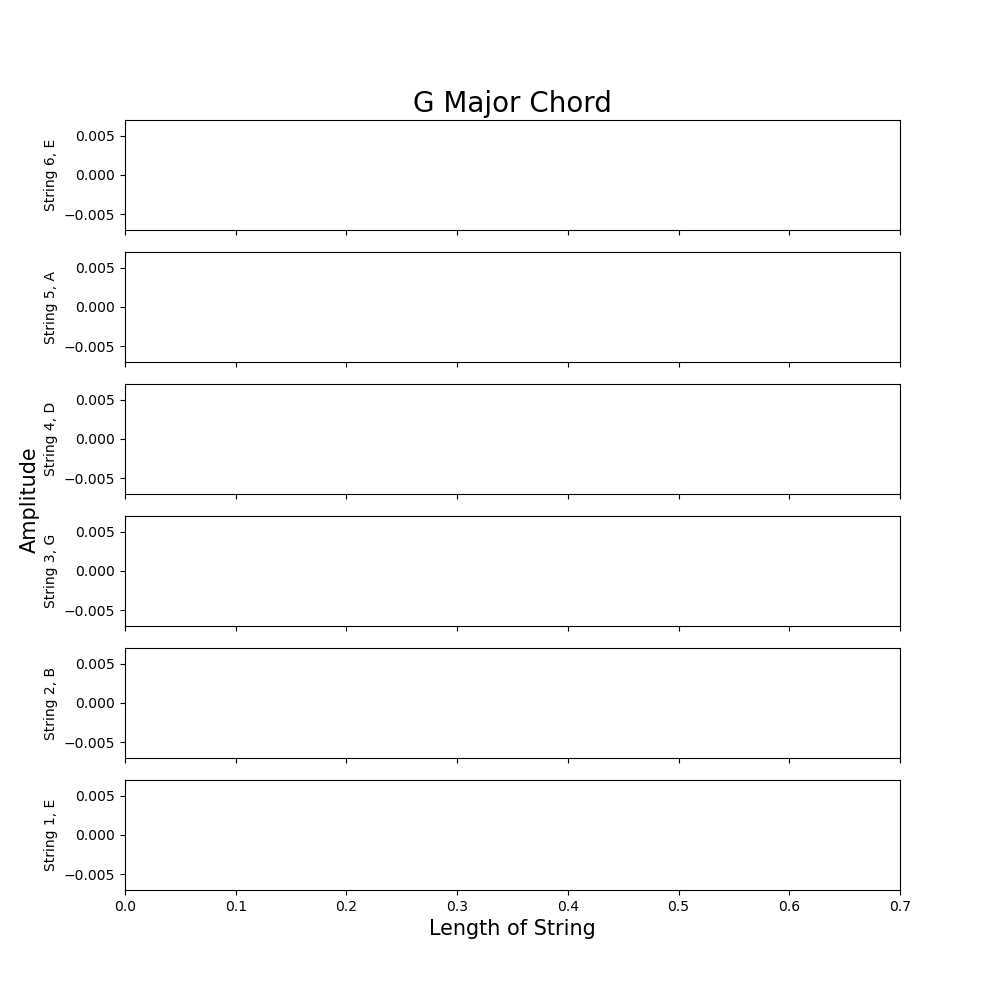

In [40]:
# Animation
fig, (ax1, ax2, ax3, ax4, ax5, ax6) = subplots(6, 1, figsize=(10, 10), sharex=True)
xlabel("Length of String", fontsize=15)  #xlabel
fig.text(0.03, 0.5, 'Amplitude', ha='center', va='center', rotation='vertical', fontsize=15)  #ylabel
ax1.set_title('G Major Chord', fontsize=20)

ax1.set_ylabel('String 6, E')
ax2.set_ylabel('String 5, A')
ax3.set_ylabel('String 4, D')
ax4.set_ylabel('String 3, G')
ax5.set_ylabel('String 2, B')
ax6.set_ylabel('String 1, E')


for ax in [ax1, ax2, ax3, ax4, ax5, ax6]:
    ax.set_ylim((-0.007, 0.007))
    ax.set_xlim((0, 0.7))
    
line6, = ax1.plot([], [], lw=2, color='b')
line5, = ax2.plot([], [], lw=2, color='g')
line4, = ax3.plot([], [], lw=2, color='r')
line3, = ax4.plot([], [], lw=2, color='c')
line2, = ax5.plot([], [], lw=2, color='m')
line1, = ax6.plot([], [], lw=2, color='y')    
    

def init():
    line1.set_data([], [])
    line2.set_data([], [])
    line3.set_data([], [])
    line4.set_data([], [])
    line5.set_data([], [])
    line6.set_data([], [])
    
    return (line6, line5, line4, line3, line2, line1)

def animate(i):
    b6 = string6_E[0]
    l6 = string6_E[1][:, i]
    line6.set_data(b6, l6)
    
    b5 = string5_A[0]
    l5 = string5_A[1][:, i]
    line5.set_data(b5, l5)
    
    b4 = string4_D[0]
    l4 = string4_D[1][:, i]
    line4.set_data(b4, l4)
    
    b3 = string3_G[0]
    l3 = string3_G[1][:, i]
    line3.set_data(b3, l3)
    
    b2 = string2_B[0]
    l2 = string2_B[1][:, i]
    line2.set_data(b2, l2)
    
    b1 = string1_E[0]
    l1 = string1_E[1][:, i]
    line1.set_data(b1, l1)
    

    return (line6, line5, line4, line3, line2, line1)

anim = animation.FuncAnimation(fig, animate, init_func=init, frames=4000, interval=10, blit=True)

HTML(anim.to_html5_video())

# Frequency Graph for Chord

<IPython.core.display.Javascript object>


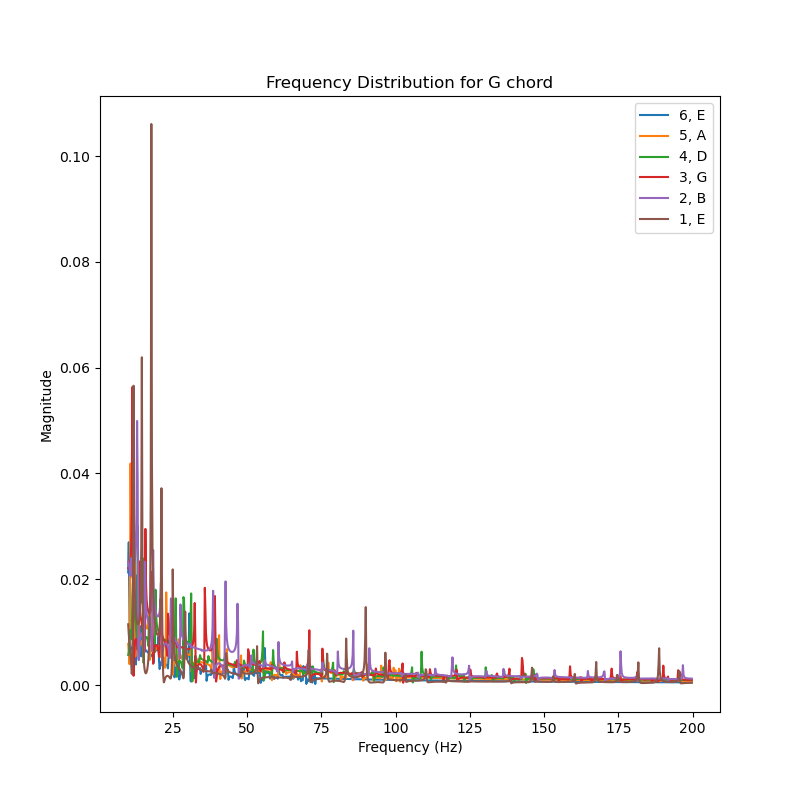

<IPython.core.display.Javascript object>


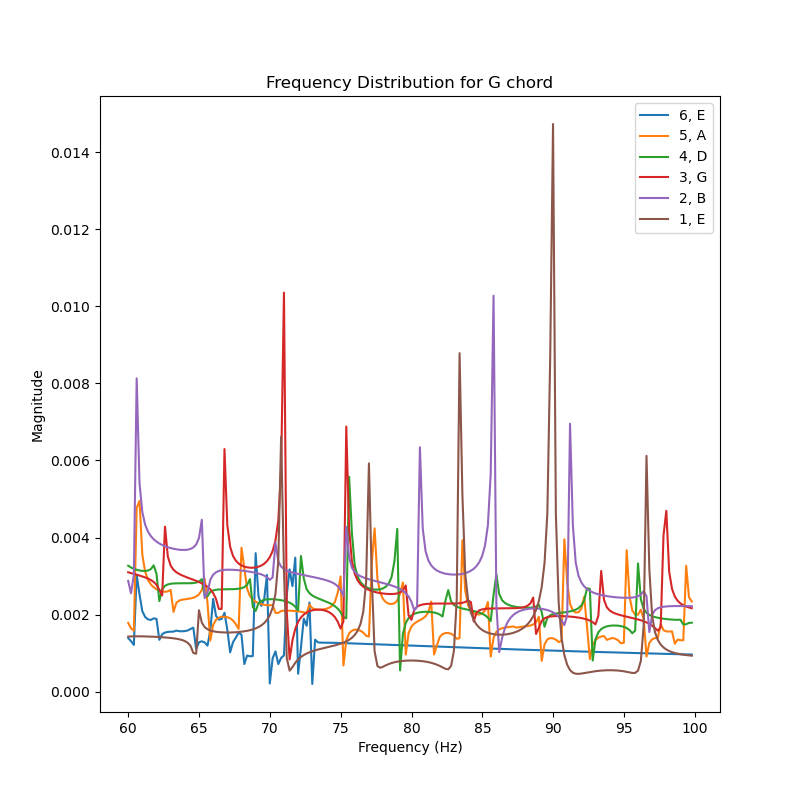

(<matplotlib.legend.Legend at 0x2b5ef9be7f0>, None)

In [49]:
b = 0.5
epsilon_values = [0.000325, 0.000612, 0.001100, 0.001893, 0.002812, 0.004271]
strings = ['6, E', '5, A', '4, D', '3, G', '2, B', '1, E']


n_values = [3, 2, 0, 0, 0, 3]  # fret number for each string
i = 0
figure(figsize=(8, 8))

for n in n_values:
    frequency, mag = determine_frequency(n, epsilon_values[i], b)
    plot(frequency[50:1000], mag[50:1000], label=rf'{strings[i]}')
    i += 1

xlabel('Frequency (Hz)'), ylabel('Magnitude'), title(rf'Frequency Distribution for G chord')
legend(), show()


figure(figsize=(8, 8))
i = 0
for n in n_values:
    frequency, mag = determine_frequency(n, epsilon_values[i], b)
    plot(frequency[300:500], mag[300:500], label=rf'{strings[i]}')  # a more zoomed in version of the string
    i += 1

xlabel('Frequency (Hz)'), ylabel('Magnitude'), title(rf'Frequency Distribution for G chord')
legend(), show()

# Same chord, new combination
Alternatively, we can write our G major chord as:

<center> String 1: 3rd fret <center>
<center> String 2: 3rd fret <center>
<center> String 3: 4th fret <center>
<center> String 4: 5th fret <center>
<center> String 5: 5th fret <center>
<center> String 6: 3rd fret <center>

<IPython.core.display.Javascript object>


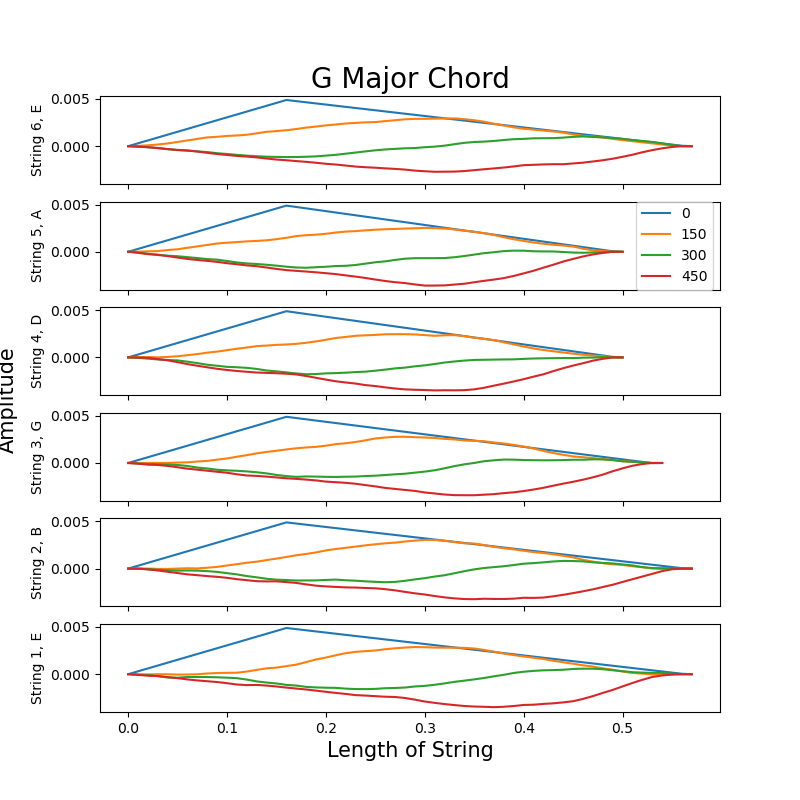

In [22]:
#                     E   ,    A    ,     D   ,     G   ,     B   ,     E
epsilon_values = [0.000325, 0.000612, 0.001100, 0.001893, 0.002812, 0.004271]

string6_E = string_motion(3, epsilon_values[0], 0.5)  # 3rd fret, epsilons from list, b = 0.5 
string5_A = string_motion(5, epsilon_values[1], 0.5)  # 2nd fret, epsilons from list, b = 0.5
string4_D = string_motion(5, epsilon_values[2], 0.5)  # open, epsilons from list, b = 0.5
string3_G = string_motion(4, epsilon_values[3], 0.5)  # open, epsilons from list, b = 0.5
string2_B = string_motion(3, epsilon_values[4], 0.5)  # open, epsilons from list, b = 0.5
string1_E = string_motion(3, epsilon_values[5], 0.5)  # 3rd fret, epsilons from list, b = 0.5


fig, (ax1, ax2, ax3, ax4, ax5, ax6) = subplots(6, sharex=True, sharey=True, figsize=(8, 8))
xlabel("Length of String", fontsize=15)
fig.text(0.01, 0.5, 'Amplitude', ha='center', va='center', rotation='vertical', fontsize=15)  # ylabel
ax1.set_title('G Major Chord', fontsize=20)

# Setting each subplot with the string
ax1.set_ylabel('String 6, E')
ax2.set_ylabel('String 5, A')
ax3.set_ylabel('String 4, D')
ax4.set_ylabel('String 3, G')
ax5.set_ylabel('String 2, B')
ax6.set_ylabel('String 1, E')

for time_instance in range(0, 600, 150):  # plotting the motion of each string in its respective subplot
    ax1.plot(string6_E[0], string6_E[1][:, time_instance])
    ax2.plot(string5_A[0], string5_A[1][:, time_instance], label=rf'{time_instance}')
    ax3.plot(string4_D[0], string4_D[1][:, time_instance])
    ax4.plot(string3_G[0], string3_G[1][:, time_instance])
    ax5.plot(string2_B[0], string2_B[1][:, time_instance])
    ax6.plot(string1_E[0], string1_E[1][:, time_instance])

ax2.legend(loc="center right")
show()

<IPython.core.display.Javascript object>


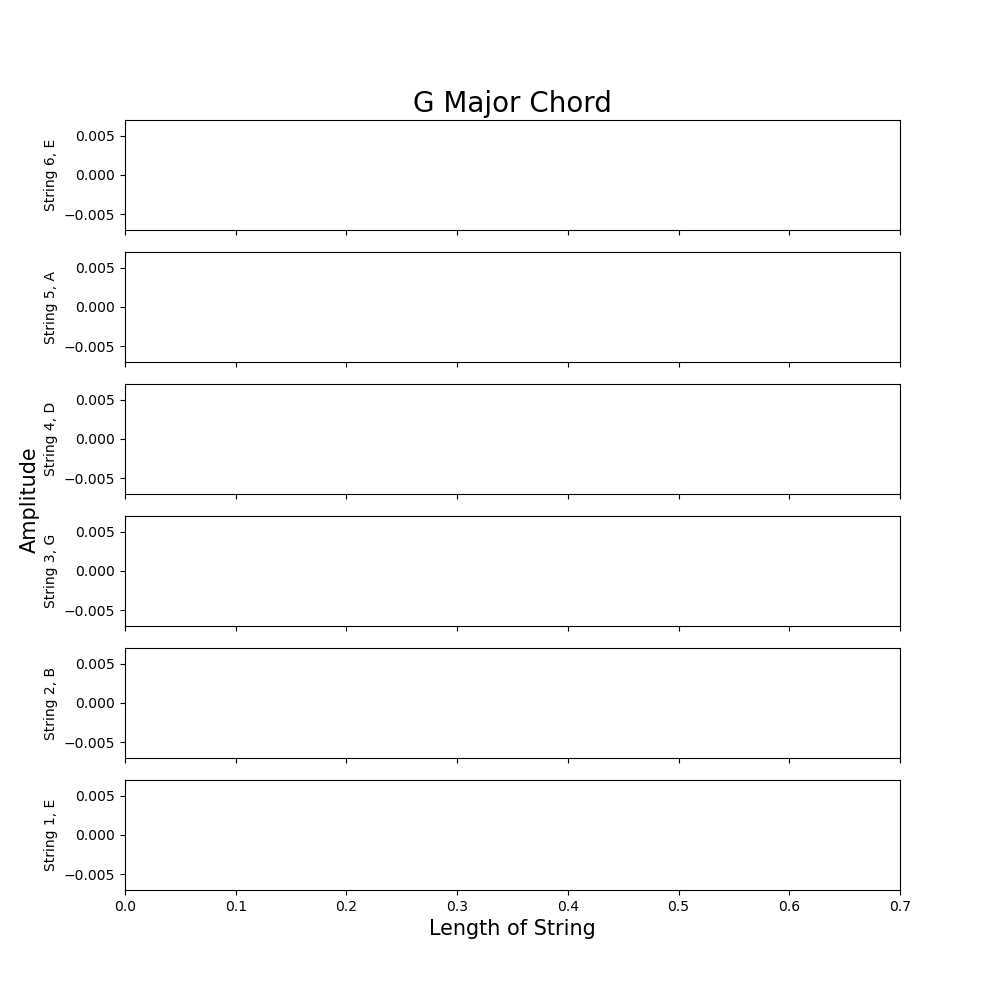

In [43]:
# Animation
fig, (ax1, ax2, ax3, ax4, ax5, ax6) = subplots(6, 1, figsize=(10, 10), sharex=True)
xlabel("Length of String", fontsize=15)  #xlabel
fig.text(0.03, 0.5, 'Amplitude', ha='center', va='center', rotation='vertical', fontsize=15)  #ylabel
ax1.set_title('G Major Chord', fontsize=20)

ax1.set_ylabel('String 6, E')
ax2.set_ylabel('String 5, A')
ax3.set_ylabel('String 4, D')
ax4.set_ylabel('String 3, G')
ax5.set_ylabel('String 2, B')
ax6.set_ylabel('String 1, E')


for ax in [ax1, ax2, ax3, ax4, ax5, ax6]:
    ax.set_ylim((-0.007, 0.007))
    ax.set_xlim((0, 0.7))
    
line6, = ax1.plot([], [], lw=2, color='b')
line5, = ax2.plot([], [], lw=2, color='g')
line4, = ax3.plot([], [], lw=2, color='r')
line3, = ax4.plot([], [], lw=2, color='c')
line2, = ax5.plot([], [], lw=2, color='m')
line1, = ax6.plot([], [], lw=2, color='y')    
    

def init():
    line1.set_data([], [])
    line2.set_data([], [])
    line3.set_data([], [])
    line4.set_data([], [])
    line5.set_data([], [])
    line6.set_data([], [])
    
    return (line6, line5, line4, line3, line2, line1)

def animate(i):
    b6 = string6_E[0]
    l6 = string6_E[1][:, i]
    line6.set_data(b6, l6)
    
    b5 = string5_A[0]
    l5 = string5_A[1][:, i]
    line5.set_data(b5, l5)
    
    b4 = string4_D[0]
    l4 = string4_D[1][:, i]
    line4.set_data(b4, l4)
    
    b3 = string3_G[0]
    l3 = string3_G[1][:, i]
    line3.set_data(b3, l3)
    
    b2 = string2_B[0]
    l2 = string2_B[1][:, i]
    line2.set_data(b2, l2)
    
    b1 = string1_E[0]
    l1 = string1_E[1][:, i]
    line1.set_data(b1, l1)
    

    return (line6, line5, line4, line3, line2, line1)

anim = animation.FuncAnimation(fig, animate, init_func=init, frames=4000, interval=10, blit=True)

HTML(anim.to_html5_video())